# **Setup and Imports**

In [ ]:
!pip install keras
!pip install split-folders
!pip install imagehash pillow
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import os
import glob as gb
import cv2
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense, BatchNormalization
from keras.callbacks import EarlyStopping, ReduceLROnPlateau
import gspread
from google.auth import default
import shutil
import random
from PIL import Image
import imagehash

sns.set(style="whitegrid")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 41.5 MB/s eta 0:00:00


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **Kaggle Data Download and Extraction**

In [ ]:
!pip install kaggle  # تثبيت مكتبة Kaggle
!kaggle datasets download -d saurabhsawhney/stanford-cars-augmented-balanced
!unzip stanford-cars-augmented-balanced.zip -d /content/data

Streaming output truncated to the last 5000 lines.
  inflating: /content/data/Augmented_Balanced_Stanford_Car_Images_Uncropped/Validation_Augmented_Images/Mercedes-Benz C-Class Sedan 2012/Val_02_06543.jpg  
  inflating: /content/data/Augmented_Balanced_Stanford_Car_Images_Uncropped/Validation_Augmented_Images/Mercedes-Benz C-Class Sedan 2012/Val_02_06861.jpg  
  inflating: /content/data/Augmented_Balanced_Stanford_Car_Images_Uncropped/Validation_Augmented_Images/Mercedes-Benz C-Class Sedan 2012/Val_02_08000.jpg  
  inflating: /content/data/Augmented_Balanced_Stanford_Car_Images_Uncropped/Validation_Augmented_Images/Mercedes-Benz C-Class Sedan 2012/Val_02_08009.jpg  
  inflating: /content/data/Augmented_Balanced_Stanford_Car_Images_Uncropped/Validation_Augmented_Images/Mercedes-Benz C-Class Sedan 2012/Val_03_00447.jpg  
  inflating: /content/data/Augmented_Balanced_Stanford_Car_Images_Uncropped/Validation_Augmented_Images/Mercedes-Benz C-Class Sedan 2012/Val_03_00519.jpg  
  inflating: 

# **Create Directory**

In [ ]:
import os

# تحديد المسار
directory_path = "/content/drive/MyDrive/deepLearning/car_classification/dataset/DATA"

os.makedirs(directory_path, exist_ok=True)
print(f"تم إنشاء المجلد: {directory_path}")

تم إنشاء المجلد: /content/drive/MyDrive/deepLearning/car_classification/dataset/DATA


# **Explore Training Classes**

In [ ]:
train_path = "/content/data/Augmented_Balanced_Stanford_Car_Images_Uncropped/Train_Augmented_Images"
train_classes = os.listdir(train_path)

print(f"الفئات داخل التدريب: {train_classes}")
print(f"عدد الفئات في التدريب: {len(train_classes)}")

الفئات داخل التدريب: ['BMW X5 SUV 2007', 'Toyota Camry Sedan 2012', 'Jeep Liberty SUV 2012', 'Chevrolet Silverado 1500 Classic Extended Cab 2007', 'Dodge Durango SUV 2007', 'Infiniti QX56 SUV 2011', 'Ford F-150 Regular Cab 2007', 'Nissan Leaf Hatchback 2012', 'Cadillac CTS-V Sedan 2012', 'Aston Martin V8 Vantage Convertible 2012', 'Land Rover Range Rover SUV 2012', 'Hyundai Elantra Touring Hatchback 2012', 'Audi S4 Sedan 2012', 'Fisker Karma Sedan 2012', 'Acura ZDX Hatchback 2012', 'Rolls-Royce Ghost Sedan 2012', 'BMW X6 SUV 2012', 'Chevrolet Express Van 2007', 'GMC Yukon Hybrid SUV 2012', 'Chevrolet Silverado 2500HD Regular Cab 2012', 'Ford Focus Sedan 2007', 'Cadillac SRX SUV 2012', 'Chevrolet Corvette ZR1 2012', 'Hyundai Tucson SUV 2012', 'Honda Accord Sedan 2012', 'Buick Rainier SUV 2007', 'Aston Martin V8 Vantage Coupe 2012', 'Ford Ranger SuperCab 2011', 'Chevrolet HHR SS 2010', 'Ford F-150 Regular Cab 2012', 'Chevrolet Express Cargo Van 2007', 'Lamborghini Reventon Coupe 2008', '

# **Select and Copy 30 Random Classes**

In [ ]:
train_path = "/content/data/Augmented_Balanced_Stanford_Car_Images_Uncropped/Train_Augmented_Images"
target_path = "/content/data_30_classes"
os.makedirs(target_path, exist_ok=True)

train_classes = os.listdir(train_path)

random_classes = random.sample(train_classes, min(30, len(train_classes)))

for cls in random_classes:
    src = os.path.join(train_path, cls)
    dest = os.path.join(target_path, cls)
    shutil.copytree(src, dest)
    num_images = len(os.listdir(dest))
    print(f"عدد الصور في الفئة '{cls}': {num_images}")

print(f"الفئات المختارة: {random_classes}")

عدد الصور في الفئة 'Plymouth Neon Coupe 1999': 450
عدد الصور في الفئة 'Volvo C30 Hatchback 2012': 448
عدد الصور في الفئة 'Chevrolet Silverado 2500HD Regular Cab 2012': 450
عدد الصور في الفئة 'GMC Acadia SUV 2012': 450
عدد الصور في الفئة 'Cadillac Escalade EXT Crew Cab 2007': 450
عدد الصور في الفئة 'Toyota Sequoia SUV 2012': 442
عدد الصور في الفئة 'Lamborghini Diablo Coupe 2001': 450
عدد الصور في الفئة 'Cadillac SRX SUV 2012': 432
عدد الصور في الفئة 'Chrysler Crossfire Convertible 2008': 435
عدد الصور في الفئة 'Bentley Mulsanne Sedan 2011': 432
عدد الصور في الفئة 'Ford Expedition EL SUV 2009': 450
عدد الصور في الفئة 'Bugatti Veyron 16.4 Coupe 2009': 450
عدد الصور في الفئة 'Honda Odyssey Minivan 2007': 432
عدد الصور في الفئة 'Audi TTS Coupe 2012': 435
عدد الصور في الفئة 'Audi S4 Sedan 2007': 450
عدد الصور في الفئة 'Isuzu Ascender SUV 2008': 432
عدد الصور في الفئة 'Dodge Ram Pickup 3500 Crew Cab 2010': 435
عدد الصور في الفئة 'Suzuki SX4 Sedan 2012': 432
عدد الصور في الفئة 'Hyundai Sonata 

# **Google Sheets to DataFrame**

In [ ]:
from google.colab import auth
import gspread
from google.auth import default
import pandas as pd

auth.authenticate_user()
creds, _ = default()
gc = gspread.authorize(creds)

spreadsheet_id = '1n2ajKkTv886XXEWNhHq9Y0nCxx2PoyLl1V3iC01tx84'
ws = gc.open_by_key(spreadsheet_id).sheet1

rows = ws.get_all_values()

if not rows:
    print("لا توجد بيانات في ورقة Google Sheets.")
else:
    result = pd.DataFrame.from_records(rows[1:], columns=rows[0])
    print(result.head())
    print(result.columns)

                                 Name of class Number of files code
0                     Plymouth Neon Coupe 1999             450    1
1                     Volvo C30 Hatchback 2012             448    2
2  Chevrolet Silverado 2500HD Regular Cab 2012             450    3
3                          GMC Acadia SUV 2012             450    4
4          Cadillac Escalade EXT Crew Cab 2007             450    5
Index(['Name of class', 'Number of files', 'code'], dtype='object')


# **Convert Columns to int64**

In [ ]:
result['Number of files'] = result['Number of files'].astype(int)
result['code'] = result['code'].astype(int)

result.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30 entries, 0 to 29
Data columns (total 3 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Name of class    30 non-null     object
 1   Number of files  30 non-null     int64 
 2   code             30 non-null     int64 
dtypes: int64(2), object(1)
memory usage: 848.0+ bytes


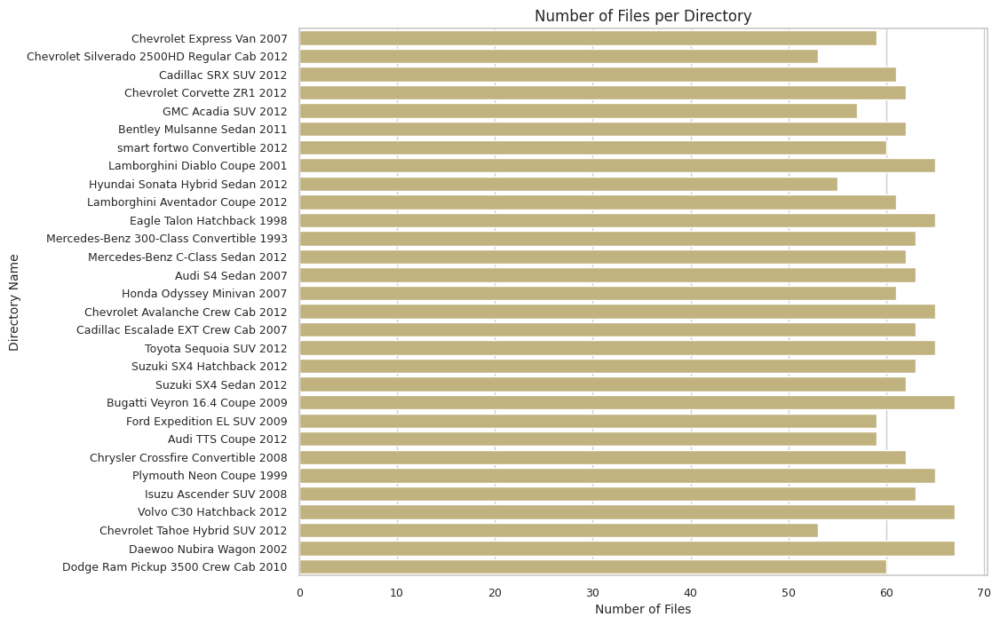

In [ ]:
plt.figure(figsize=(10, 8))
ax = sns.barplot(data=df, x='Number_of_files', y='Directory_Name', orient="h", color="y")

plt.xlabel("Number of Files", fontsize=10)
plt.ylabel("Directory Name", fontsize=10)
plt.title("Number of Files per Directory", fontsize=12)
plt.xticks(fontsize=9)
plt.yticks(fontsize=9)

plt.show()

In [ ]:
flat_list = list(result["Name of class"])
print(flat_list)

codes = dict(zip(result["Name of class"], result["code"]))
print(codes)

def getcode(n):
    for x, y in codes.items():
        if n == y:
            return x
    return None
input_folder = "/content/data_30_classes"

for subdir, dirs, files in os.walk(input_folder):
    for file in files:
        print(os.path.join(subdir, file))

Streaming output truncated to the last 5000 lines.
/content/data_30_classes/Suzuki SX4 Hatchback 2012/Train_13_06272.jpg
/content/data_30_classes/Suzuki SX4 Hatchback 2012/Train_01_05951.jpg
/content/data_30_classes/Suzuki SX4 Hatchback 2012/Train_16_04587.jpg
/content/data_30_classes/Suzuki SX4 Hatchback 2012/Train_13_05109.jpg
/content/data_30_classes/Suzuki SX4 Hatchback 2012/Train_12_04582.jpg
/content/data_30_classes/Suzuki SX4 Hatchback 2012/Train_11_03487.jpg
/content/data_30_classes/Suzuki SX4 Hatchback 2012/Train_07_06777.jpg
/content/data_30_classes/Suzuki SX4 Hatchback 2012/Train_04_05234.jpg
/content/data_30_classes/Suzuki SX4 Hatchback 2012/Train_11_04587.jpg
/content/data_30_classes/Suzuki SX4 Hatchback 2012/Train_09_00230.jpg
/content/data_30_classes/Suzuki SX4 Hatchback 2012/Train_08_03518.jpg
/content/data_30_classes/Suzuki SX4 Hatchback 2012/Train_10_00230.jpg
/content/data_30_classes/Suzuki SX4 Hatchback 2012/Train_10_04582.jpg
/content/data_30_classes/Suzuki SX4 Hat

Files in  /content/data_30_classes 0
Files in  /content/data_30_classes/Chevrolet Express Van 2007 437
Files in  /content/data_30_classes/Chevrolet Silverado 2500HD Regular Cab 2012 450
Files in  /content/data_30_classes/Cadillac SRX SUV 2012 432
Files in  /content/data_30_classes/Chevrolet Corvette ZR1 2012 448
Files in  /content/data_30_classes/GMC Acadia SUV 2012 450
Files in  /content/data_30_classes/Bentley Mulsanne Sedan 2011 432
Files in  /content/data_30_classes/smart fortwo Convertible 2012 432
Files in  /content/data_30_classes/Lamborghini Diablo Coupe 2001 450
Files in  /content/data_30_classes/Hyundai Sonata Hybrid Sedan 2012 437
Files in  /content/data_30_classes/Lamborghini Aventador Coupe 2012 450
Files in  /content/data_30_classes/Eagle Talon Hatchback 1998 434
Files in  /content/data_30_classes/Mercedes-Benz 300-Class Convertible 1993 448
Files in  /content/data_30_classes/Mercedes-Benz C-Class Sedan 2012 434
Files in  /content/data_30_classes/Audi S4 Sedan 2007 450
Fi

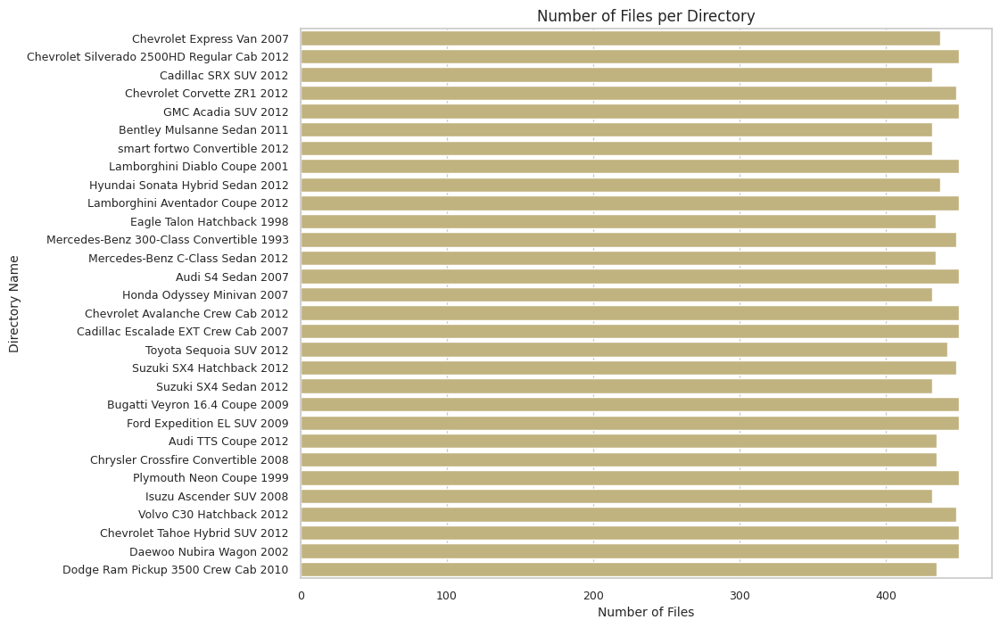

In [ ]:
N = 0
Number_of_files = []
for subdir, dirs, files in os.walk(input_folder):
    N_c = len(files)
    N += N_c
    print ("Files in ", subdir, N_c)
    if len(files) < 1:
        continue
    Number_of_files.append(len(files))
print( "Total Files ",N)

Directory_Name = os.listdir(input_folder)
df = pd.DataFrame({"Directory_Name": Directory_Name,
                   "Number_of_files": Number_of_files})
print(df)
plt.figure(figsize=(10, 8))
ax = sns.barplot(data=df, x='Number_of_files', y='Directory_Name', orient="h", color="y")

plt.xlabel("Number of Files", fontsize=10)
plt.ylabel("Directory Name", fontsize=10)
plt.title("Number of Files per Directory", fontsize=12)
plt.xticks(fontsize=9)
plt.yticks(fontsize=9)

plt.show()

# **List Images by Class**

In [ ]:
fnames = os.listdir(input_folder)
fnames = sorted(fnames)
num_files = len(fnames)
images_list = []
obj = {}
i = 0

while i < num_files:
    images_list = []
    files= os.listdir(input_folder+'/'+fnames[i])
    for file in files:
      images_list.append(os.path.join(input_folder+'/'+fnames[i], file))
    obj[fnames[i]] = images_list
    i += 1

obj.keys()

dict_keys(['Audi S4 Sedan 2007', 'Audi TTS Coupe 2012', 'Bentley Mulsanne Sedan 2011', 'Bugatti Veyron 16.4 Coupe 2009', 'Cadillac Escalade EXT Crew Cab 2007', 'Cadillac SRX SUV 2012', 'Chevrolet Avalanche Crew Cab 2012', 'Chevrolet Corvette ZR1 2012', 'Chevrolet Express Van 2007', 'Chevrolet Silverado 2500HD Regular Cab 2012', 'Chevrolet Tahoe Hybrid SUV 2012', 'Chrysler Crossfire Convertible 2008', 'Daewoo Nubira Wagon 2002', 'Dodge Ram Pickup 3500 Crew Cab 2010', 'Eagle Talon Hatchback 1998', 'Ford Expedition EL SUV 2009', 'GMC Acadia SUV 2012', 'Honda Odyssey Minivan 2007', 'Hyundai Sonata Hybrid Sedan 2012', 'Isuzu Ascender SUV 2008', 'Lamborghini Aventador Coupe 2012', 'Lamborghini Diablo Coupe 2001', 'Mercedes-Benz 300-Class Convertible 1993', 'Mercedes-Benz C-Class Sedan 2012', 'Plymouth Neon Coupe 1999', 'Suzuki SX4 Hatchback 2012', 'Suzuki SX4 Sedan 2012', 'Toyota Sequoia SUV 2012', 'Volvo C30 Hatchback 2012', 'smart fortwo Convertible 2012'])

# **Remove Duplicate Images**

In [ ]:
for key, value in obj.items():
    image_fns = value
    img_hashes = {}

    for img_fn in sorted(image_fns):
        hash_value = imagehash.average_hash(Image.open(img_fn))
        if hash_value in img_hashes:
            print(f"Removing duplicate image: {img_fn} (duplicate of {img_hashes[hash_value]})")
            os.remove(img_fn)

        else:
            img_hashes[hash_value] = img_fn

Removing duplicate image: /content/data_30_classes/Audi S4 Sedan 2007/Train_02_07889.jpg (duplicate of /content/data_30_classes/Audi S4 Sedan 2007/Train_01_07889.jpg)
Removing duplicate image: /content/data_30_classes/Audi S4 Sedan 2007/Train_02_07938.jpg (duplicate of /content/data_30_classes/Audi S4 Sedan 2007/Train_01_07938.jpg)
Removing duplicate image: /content/data_30_classes/Audi S4 Sedan 2007/Train_02_08026.jpg (duplicate of /content/data_30_classes/Audi S4 Sedan 2007/Train_01_08026.jpg)
Removing duplicate image: /content/data_30_classes/Audi S4 Sedan 2007/Train_03_05908.jpg (duplicate of /content/data_30_classes/Audi S4 Sedan 2007/Train_02_05908.jpg)
Removing duplicate image: /content/data_30_classes/Audi S4 Sedan 2007/Train_03_07590.jpg (duplicate of /content/data_30_classes/Audi S4 Sedan 2007/Train_01_07590.jpg)
Removing duplicate image: /content/data_30_classes/Audi S4 Sedan 2007/Train_04_00750.jpg (duplicate of /content/data_30_classes/Audi S4 Sedan 2007/Train_03_00750.jpg

Files in  /content/data_30_classes 0
Files in  /content/data_30_classes/Chevrolet Express Van 2007 296
Files in  /content/data_30_classes/Chevrolet Silverado 2500HD Regular Cab 2012 267
Files in  /content/data_30_classes/Cadillac SRX SUV 2012 306
Files in  /content/data_30_classes/Chevrolet Corvette ZR1 2012 314
Files in  /content/data_30_classes/GMC Acadia SUV 2012 288
Files in  /content/data_30_classes/Bentley Mulsanne Sedan 2011 311
Files in  /content/data_30_classes/smart fortwo Convertible 2012 304
Files in  /content/data_30_classes/Lamborghini Diablo Coupe 2001 328
Files in  /content/data_30_classes/Hyundai Sonata Hybrid Sedan 2012 276
Files in  /content/data_30_classes/Lamborghini Aventador Coupe 2012 306
Files in  /content/data_30_classes/Eagle Talon Hatchback 1998 328
Files in  /content/data_30_classes/Mercedes-Benz 300-Class Convertible 1993 318
Files in  /content/data_30_classes/Mercedes-Benz C-Class Sedan 2012 313
Files in  /content/data_30_classes/Audi S4 Sedan 2007 319
Fi

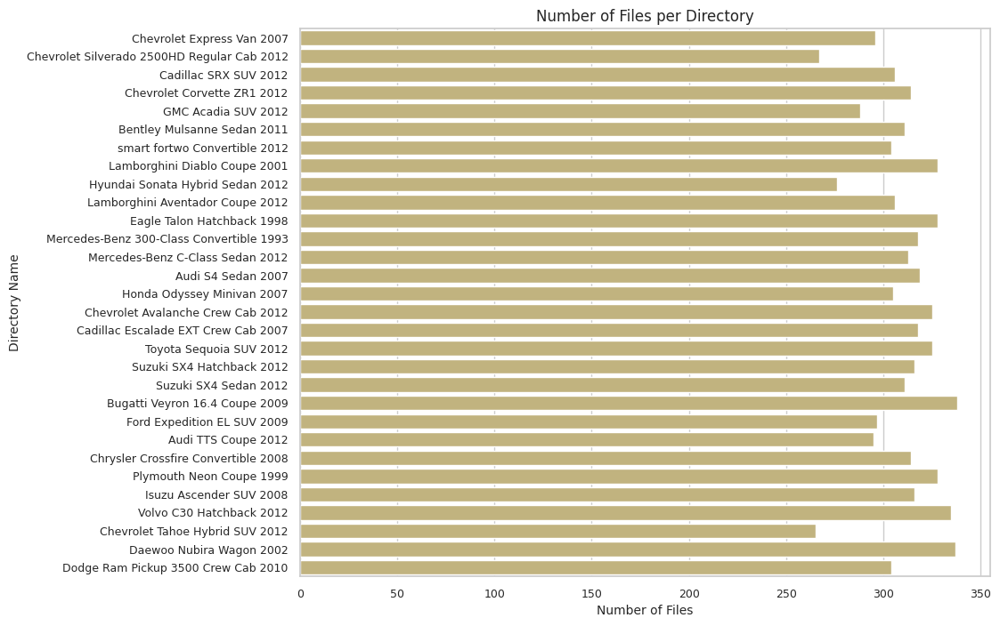

In [ ]:
a=[]
N = 0
Number_of_files = []
for subdir, dirs, files in os.walk(input_folder):
    N_c = len(files)
    N += N_c
    print ("Files in ", subdir, N_c)
    if N_c>0 and N_c<100:
     a.append(subdir)
    if len(files) < 1:
        continue
    Number_of_files.append(len(files))
print( "Total Files ",N)
print( "Average Files ",N/20)
print(a)

Directory_Name = os.listdir(input_folder)


df = pd.DataFrame({"Directory_Name": Directory_Name,
                   "Number_of_files": Number_of_files})
print(df)
plt.figure(figsize=(10, 8))
ax = sns.barplot(data=df, x='Number_of_files', y='Directory_Name', orient="h", color="y")

plt.xlabel("Number of Files", fontsize=10)
plt.ylabel("Directory Name", fontsize=10)
plt.title("Number of Files per Directory", fontsize=12)
plt.xticks(fontsize=9)
plt.yticks(fontsize=9)

plt.show()

# **Split Dataset into Train/Val/Test**

In [ ]:
import splitfolders
input_folder = "/content/data_30_classes"
output = "/content/drive/MyDrive/deepLearning/car_classification/dataset/DATA"
splitfolders.ratio(input_folder, output=output, seed=42, ratio=(.7, .2, .1))

Copying files: 9303 files [01:36, 96.13 files/s] 


For training data , found 207 in folder Chevrolet Express Van 2007
For training data , found 186 in folder Chevrolet Silverado 2500HD Regular Cab 2012
For training data , found 214 in folder Cadillac SRX SUV 2012
For training data , found 219 in folder Chevrolet Corvette ZR1 2012
For training data , found 201 in folder GMC Acadia SUV 2012
For training data , found 217 in folder Bentley Mulsanne Sedan 2011
For training data , found 212 in folder smart fortwo Convertible 2012
For training data , found 229 in folder Lamborghini Diablo Coupe 2001
For training data , found 193 in folder Hyundai Sonata Hybrid Sedan 2012
For training data , found 214 in folder Lamborghini Aventador Coupe 2012
For training data , found 229 in folder Eagle Talon Hatchback 1998
For training data , found 222 in folder Mercedes-Benz 300-Class Convertible 1993
For training data , found 219 in folder Mercedes-Benz C-Class Sedan 2012
For training data , found 223 in folder Audi S4 Sedan 2007
For training data , found

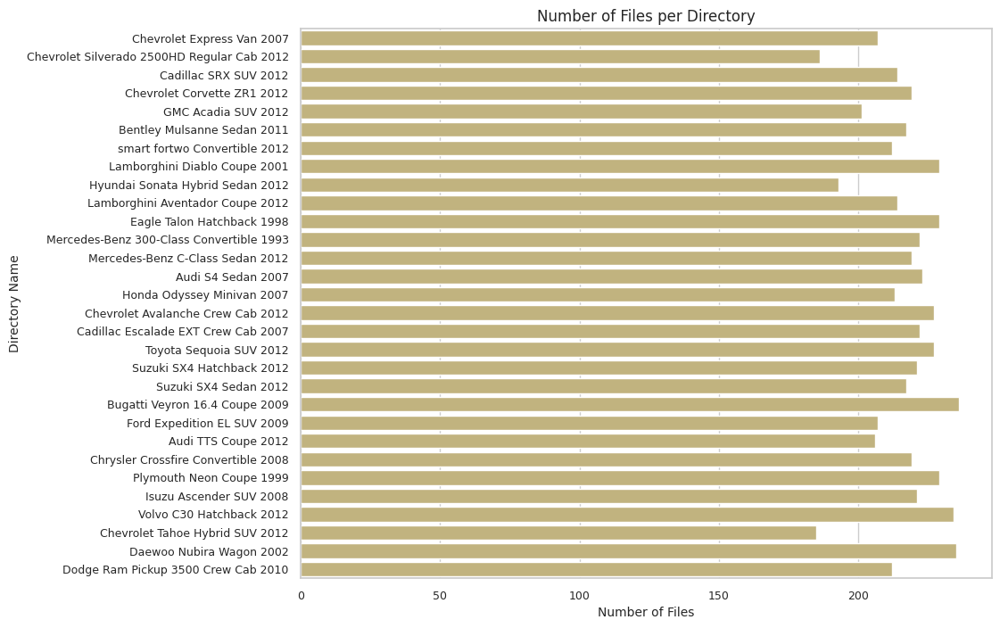

In [ ]:
trainpath = "/content/drive/MyDrive/deepLearning/car_classification/dataset/DATA/"
testpath = "/content/drive/MyDrive/deepLearning/car_classification/dataset/DATA/"
predpath = "/content/drive/MyDrive/deepLearning/car_classification/dataset/DATA/"
N=0
Number_of_files = []
for folder in  os.listdir(trainpath + 'train') :
    files = gb.glob(pathname= str( trainpath +'train//' + folder + '/*.jpg'))
    N+=len(files)
    print(f'For training data , found {len(files)} in folder {folder}')
    if len(files) < 1:
        continue
    Number_of_files.append(len(files))
print(N)
print(N/20)

Directory_Name = os.listdir(trainpath + 'train')

df = pd.DataFrame({"Directory_Name": Directory_Name,
                   "Number_of_files": Number_of_files})
print(df)

plt.figure(figsize=(10, 8))
ax = sns.barplot(data=df, x='Number_of_files', y='Directory_Name', orient="h", color="y")

plt.xlabel("Number of Files", fontsize=10)
plt.ylabel("Directory Name", fontsize=10)
plt.title("Number of Files per Directory", fontsize=12)
plt.xticks(fontsize=9)
plt.yticks(fontsize=9)

plt.show()

For training data , found 30 in folder Chevrolet Express Van 2007
For training data , found 28 in folder Chevrolet Silverado 2500HD Regular Cab 2012
For training data , found 31 in folder Cadillac SRX SUV 2012
For training data , found 33 in folder Chevrolet Corvette ZR1 2012
For training data , found 30 in folder GMC Acadia SUV 2012
For training data , found 32 in folder Bentley Mulsanne Sedan 2011
For training data , found 32 in folder smart fortwo Convertible 2012
For training data , found 34 in folder Lamborghini Diablo Coupe 2001
For training data , found 28 in folder Hyundai Sonata Hybrid Sedan 2012
For training data , found 31 in folder Lamborghini Aventador Coupe 2012
For training data , found 34 in folder Eagle Talon Hatchback 1998
For training data , found 33 in folder Mercedes-Benz 300-Class Convertible 1993
For training data , found 32 in folder Mercedes-Benz C-Class Sedan 2012
For training data , found 33 in folder Audi S4 Sedan 2007
For training data , found 31 in folder 

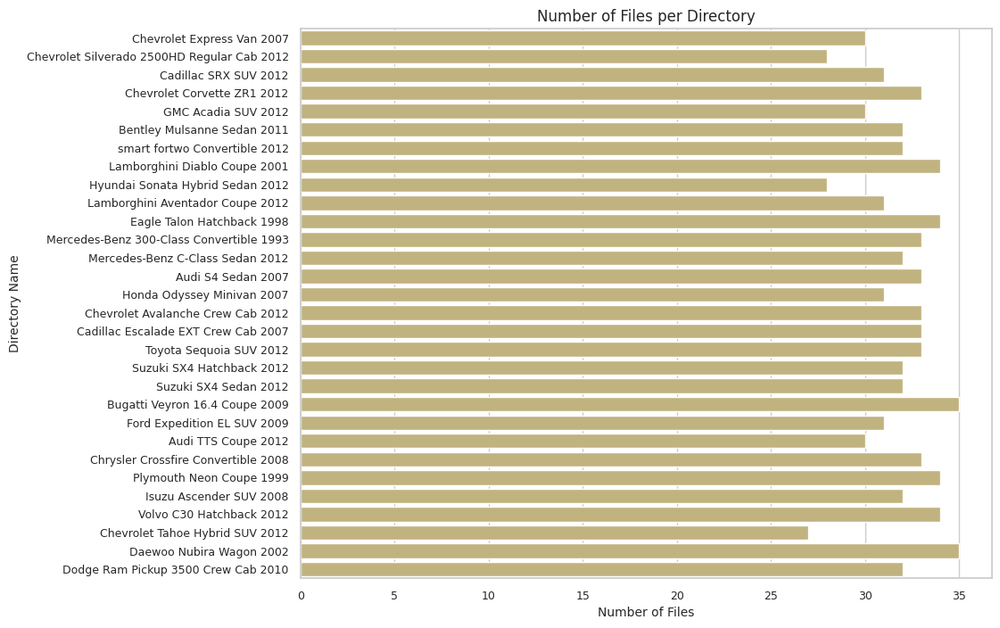

In [ ]:
N=0
Number_of_files = []
for folder in  os.listdir(testpath + 'test') :
    files = gb.glob(pathname= str( testpath +'test//' + folder + '/*.jpg'))
    N+=len(files)
    print(f'For training data , found {len(files)} in folder {folder}')
    if len(files) < 1:
        continue
    Number_of_files.append(len(files))
print(N)
print(N/20)

Directory_Name = os.listdir(testpath + 'test')

df = pd.DataFrame({"Directory_Name": Directory_Name,
                   "Number_of_files": Number_of_files})
print(df)

plt.figure(figsize=(10, 8))
ax = sns.barplot(data=df, x='Number_of_files', y='Directory_Name', orient="h", color="y")

plt.xlabel("Number of Files", fontsize=10)
plt.ylabel("Directory Name", fontsize=10)
plt.title("Number of Files per Directory", fontsize=12)
plt.xticks(fontsize=9)
plt.yticks(fontsize=9)

plt.show()

For prediction data , found 59 in folder Chevrolet Express Van 2007
For prediction data , found 53 in folder Chevrolet Silverado 2500HD Regular Cab 2012
For prediction data , found 61 in folder Cadillac SRX SUV 2012
For prediction data , found 62 in folder Chevrolet Corvette ZR1 2012
For prediction data , found 57 in folder GMC Acadia SUV 2012
For prediction data , found 62 in folder Bentley Mulsanne Sedan 2011
For prediction data , found 60 in folder smart fortwo Convertible 2012
For prediction data , found 65 in folder Lamborghini Diablo Coupe 2001
For prediction data , found 55 in folder Hyundai Sonata Hybrid Sedan 2012
For prediction data , found 61 in folder Lamborghini Aventador Coupe 2012
For prediction data , found 65 in folder Eagle Talon Hatchback 1998
For prediction data , found 63 in folder Mercedes-Benz 300-Class Convertible 1993
For prediction data , found 62 in folder Mercedes-Benz C-Class Sedan 2012
For prediction data , found 63 in folder Audi S4 Sedan 2007
For predict

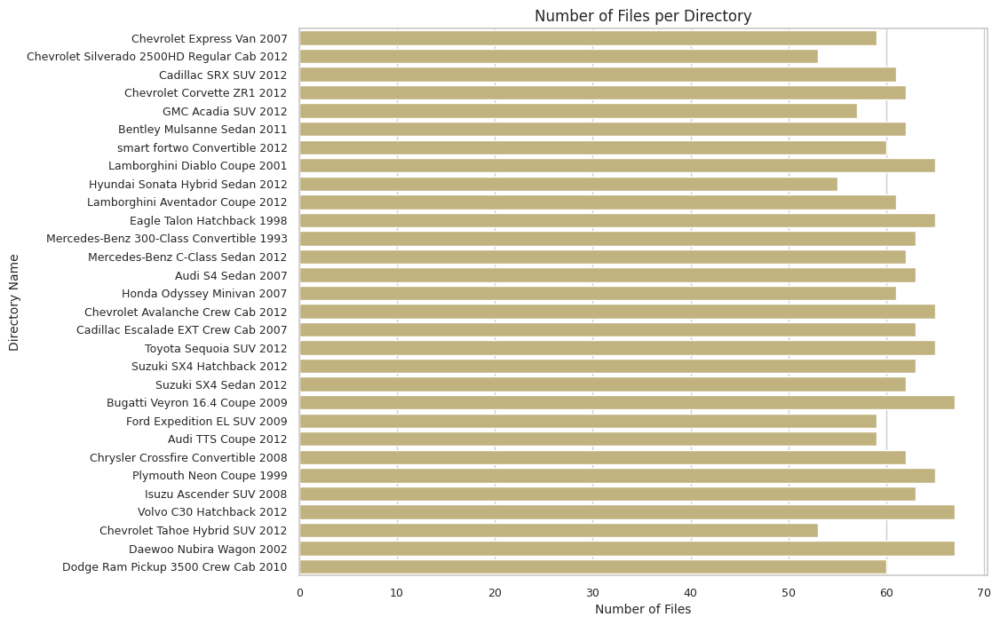

In [ ]:
N=0
Number_of_files = []
for folder in  os.listdir(predpath + 'val') :
    files = gb.glob(pathname= str( predpath +'val//' + folder + '/*.jpg'))
    N+=len(files)
    print(f'For prediction data , found {len(files)} in folder {folder}')
    if len(files) < 1:
        continue
    Number_of_files.append(len(files))
print(N)
print(N/20)

Directory_Name = os.listdir(predpath + 'val')

df = pd.DataFrame({"Directory_Name": Directory_Name,
                   "Number_of_files": Number_of_files})
print(df)

plt.figure(figsize=(10, 8))
ax = sns.barplot(data=df, x='Number_of_files', y='Directory_Name', orient="h", color="y")

plt.xlabel("Number of Files", fontsize=10)
plt.ylabel("Directory Name", fontsize=10)
plt.title("Number of Files per Directory", fontsize=12)
plt.yticks(fontsize=9)

plt.show()

# **Count Image Dimensions in Training Data**

In [ ]:
size = []
for folder in  os.listdir(trainpath +'train') :
    files = gb.glob(pathname= str( trainpath +'train//' + folder + '/*.jpg'))
    for file in files:
        image = plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

,count
"(480, 640, 3)",804
"(194, 259, 3)",513
"(768, 1024, 3)",276
"(225, 300, 3)",230
"(360, 480, 3)",118
...,...
"(300, 300, 3)",2
"(1386, 2100, 3)",2
"(640, 1024, 3)",2
"(404, 610, 3)",2


# **Resize Images in Training, Test, and Validation Folders**

In [ ]:
folders = [
    "/content/drive/MyDrive/deepLearning/car_classification/dataset/DATA/train",
    "/content/drive/MyDrive/deepLearning/car_classification/dataset/DATA/test",
    "/content/drive/MyDrive/deepLearning/car_classification/dataset/DATA/val"
]

target_size = (224, 224)

for folder in folders:
    for class_folder in os.listdir(folder):
        class_path = os.path.join(folder, class_folder)
        if os.path.isdir(class_path):
            for file in os.listdir(class_path):
                if file.endswith('.jpg') or file.endswith('.png'):
                    img_path = os.path.join(class_path, file)
                    img = Image.open(img_path)

                    if img.mode != 'RGB':
                        img = img.convert('RGB')

                    img = img.resize(target_size)
                    img.save(img_path)

            print(f"تم تغيير حجم الصور في {class_path} بنجاح.")

تم تغيير حجم الصور في /content/drive/MyDrive/deepLearning/car_classification/dataset/DATA/train/Chevrolet Express Van 2007 بنجاح.
تم تغيير حجم الصور في /content/drive/MyDrive/deepLearning/car_classification/dataset/DATA/train/Chevrolet Silverado 2500HD Regular Cab 2012 بنجاح.
تم تغيير حجم الصور في /content/drive/MyDrive/deepLearning/car_classification/dataset/DATA/train/Cadillac SRX SUV 2012 بنجاح.
تم تغيير حجم الصور في /content/drive/MyDrive/deepLearning/car_classification/dataset/DATA/train/Chevrolet Corvette ZR1 2012 بنجاح.
تم تغيير حجم الصور في /content/drive/MyDrive/deepLearning/car_classification/dataset/DATA/train/GMC Acadia SUV 2012 بنجاح.
تم تغيير حجم الصور في /content/drive/MyDrive/deepLearning/car_classification/dataset/DATA/train/Bentley Mulsanne Sedan 2011 بنجاح.
تم تغيير حجم الصور في /content/drive/MyDrive/deepLearning/car_classification/dataset/DATA/train/smart fortwo Convertible 2012 بنجاح.
تم تغيير حجم الصور في /content/drive/MyDrive/deepLearning/car_classification/dat

# **Count Image Dimensions in Training Data**

In [ ]:
size = []
for folder in  os.listdir(trainpath +'train') :
    files = gb.glob(pathname= str( trainpath +'train//' + folder + '/*.jpg'))
    for file in files:
        image = plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

,count
"(224, 224, 3)",6496


# **Count Image Dimensions in Testing Data**

In [ ]:
size = []
for folder in  os.listdir(testpath +'test') :
    files = gb.glob(pathname= str( testpath +'test//' + folder + '/*.jpg'))
    for file in files:
        image = plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()


,count
"(224, 224, 3)",958


# **Count Image Dimensions in Validation Data**

In [ ]:
size = []
for folder in  os.listdir(predpath +'val'):
 files = gb.glob(pathname= str( predpath +'val//'+ folder + '/*.jpg') )
 for file in files:
        image = plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()


,count
"(224, 224, 3)",1849


# **Set Image Size and Batch Size**

In [ ]:
s = 224
batch_size = 64

#**Data Augmentation**

In [ ]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

train_generator = train_datagen.flow_from_directory(
    trainpath + 'train',
    target_size=(s, s),
    class_mode='categorical',
    batch_size=batch_size
)

Found 6496 images belonging to 30 classes.


# **CNN Model Creation**

In [ ]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense, Input

s = 200
batch_size = 64

model = Sequential()

model.add(Input(shape=(s, s, 3)))

model.add(Conv2D(64, (5, 5), activation='relu'))
model.add(Conv2D(filters=64, kernel_size=(5, 5), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(rate=0.15))
model.add(Conv2D(filters=64, kernel_size=(3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(rate=0.15))
model.add(Conv2D(filters=64, kernel_size=(3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(rate=0.15))
model.add(Flatten())

model.add(Dense(300, activation='relu'))
model.add(Dropout(rate=0.25))
model.add(Dense(30, activation='softmax'))
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_2 (Conv2D)                    │ (None, 196, 196, 64)        │           4,864 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 192, 192, 64)        │         102,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 96, 96, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 96, 96, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 94, 94, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 47, 47, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 47, 47, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 45, 45, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 22, 22, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 22, 22, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 30976)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 300)                 │       9,293,100 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 300)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 30)                  │           9,030 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,483,314 (36.18 MB)

 Trainable params: 9,483,314 (36.18 MB)

 Non-trainable params: 0 (0.00 B)

# **Callbacks Setup**

In [ ]:
earlystop = EarlyStopping(patience=10)
# learning_rate_reduction = ReduceLROnPlateau(monitor='val_loss',
#                                             patience=2,
#                                             verbose=1,
#                                             factor=0.5,
#                                             min_lr=0.00001)
callbacks = [earlystop]

# **Data Augmentation for Training**

In [ ]:
train_datagen = ImageDataGenerator(
        rescale=1./255,
        rotation_range=10,
        horizontal_flip=True
)
train_generator = train_datagen.flow_from_directory(
        trainpath+"/train",
        target_size=(s,s),
        class_mode='categorical',
)

Found 6496 images belonging to 30 classes.


# **Visualize Augmented Training Images**

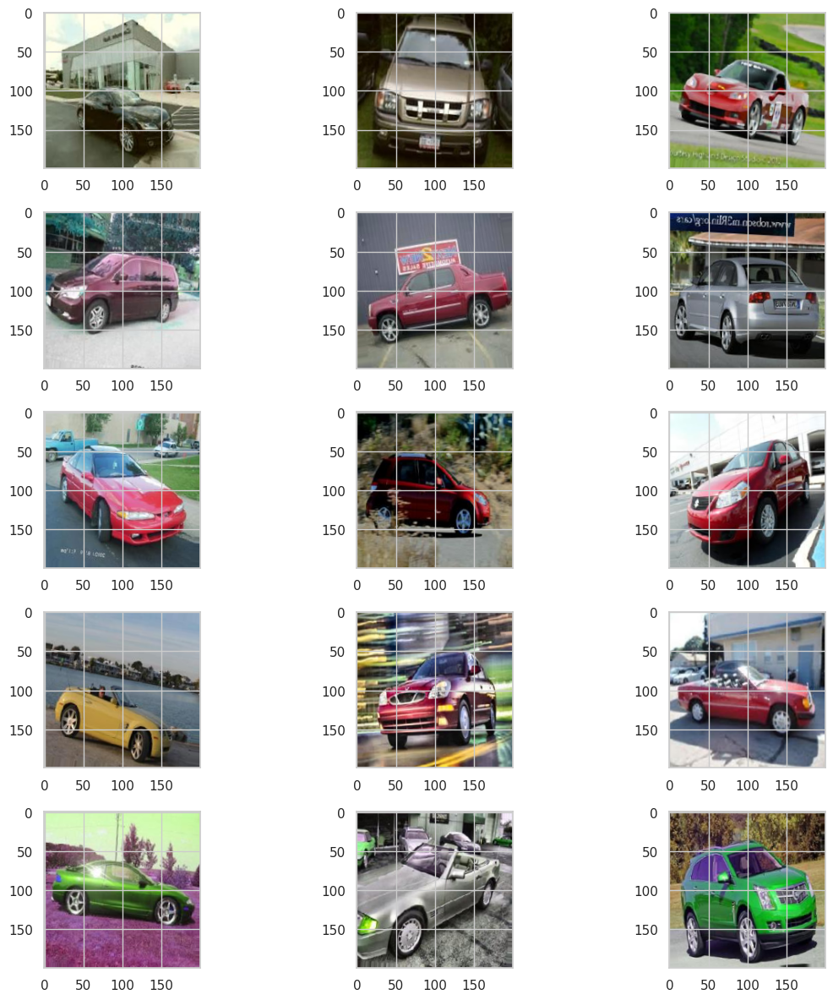

In [ ]:
plt.figure(figsize=(12, 12))
for i in range(0, 15):
    plt.subplot(5, 3, i+1)
    for X_batch, Y_batch in train_generator:
        image = X_batch[0]
        plt.imshow(image)
        break
plt.tight_layout()
plt.show()

# **Validation Data Generator Setup**

In [ ]:
validation_datagen = ImageDataGenerator(rescale=1./255)
validation_generator = validation_datagen.flow_from_directory(
   predpath+'/val',
    target_size=(s,s),
   class_mode='categorical',
)

Found 1849 images belonging to 30 classes.


# **Visualize Validation Images**

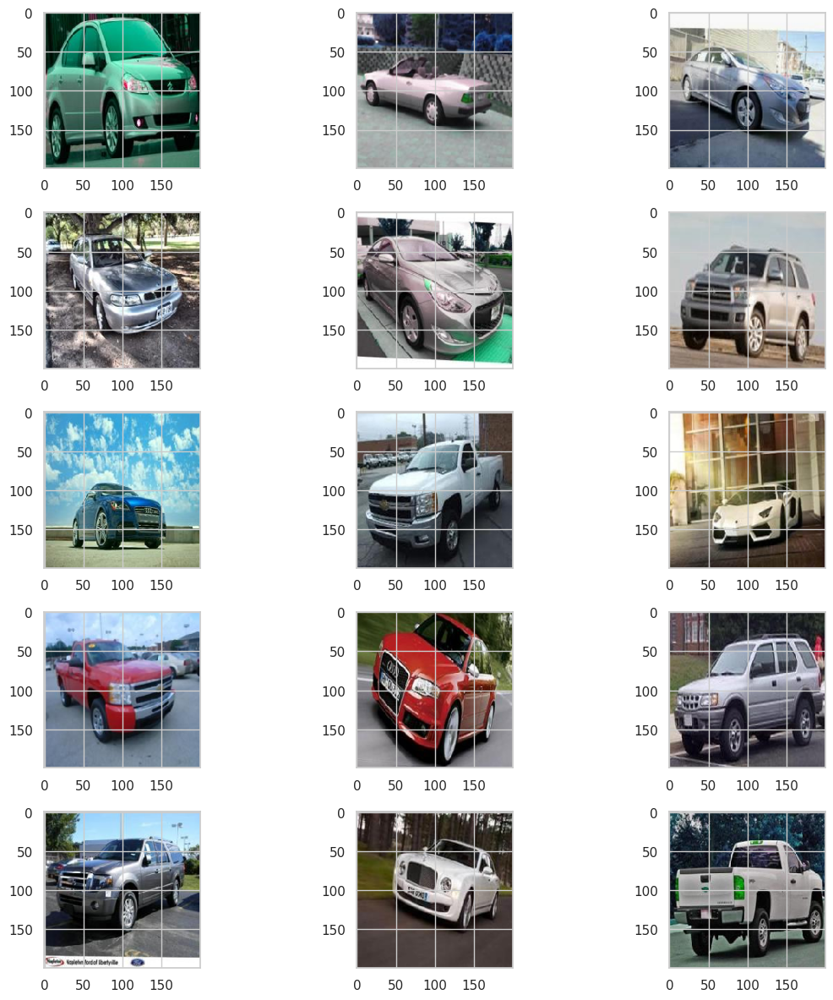

In [ ]:
plt.figure(figsize=(12, 12))
for i in range(0, 15):
    plt.subplot(5, 3, i+1)
    for X_batch, Y_batch in validation_generator:
        image = X_batch[0]
        plt.imshow(image)
        break
plt.tight_layout()
plt.show()

# **Train Model**

In [ ]:
history = model.fit(
    train_generator,
    epochs=50,
    validation_data=validation_generator,
    callbacks=callbacks)

Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


203/203 ━━━━━━━━━━━━━━━━━━━━ 139s 560ms/step - accuracy: 0.0410 - loss: 3.4152 - val_accuracy: 0.0865 - val_loss: 3.2800
Epoch 2/50
203/203 ━━━━━━━━━━━━━━━━━━━━ 110s 501ms/step - accuracy: 0.1041 - loss: 3.1909 - val_accuracy: 0.2466 - val_loss: 2.7356
Epoch 3/50
203/203 ━━━━━━━━━━━━━━━━━━━━ 141s 496ms/step - accuracy: 0.2929 - loss: 2.5832 - val_accuracy: 0.4786 - val_loss: 1.9580
Epoch 4/50
203/203 ━━━━━━━━━━━━━━━━━━━━ 103s 495ms/step - accuracy: 0.4505 - loss: 2.0411 - val_accuracy: 0.5965 - val_loss: 1.5547
Epoch 5/50
203/203 ━━━━━━━━━━━━━━━━━━━━ 101s 481ms/step - accuracy: 0.5742 - loss: 1.5807 - val_accuracy: 0.6733 - val_loss: 1.2868
Epoch 6/50
203/203 ━━━━━━━━━━━━━━━━━━━━ 140s 471ms/step - accuracy: 0.6415 - loss: 1.3365 - val_accuracy: 0.7442 - val_loss: 1.0434
Epoch 7/50
203/203 ━━━━━━━━━━━━━━━━━━━━ 99s 469ms/step - accuracy: 0.7202 - loss: 1.0561 - val_accuracy: 0.7572 - val_loss: 0.9304
Epoch 8/50
203/203 ━━━━━━━━━━━━━━━━━━━━ 141s 472ms/step - accuracy: 0.7674 - loss: 0.898

# **Plot Training History**

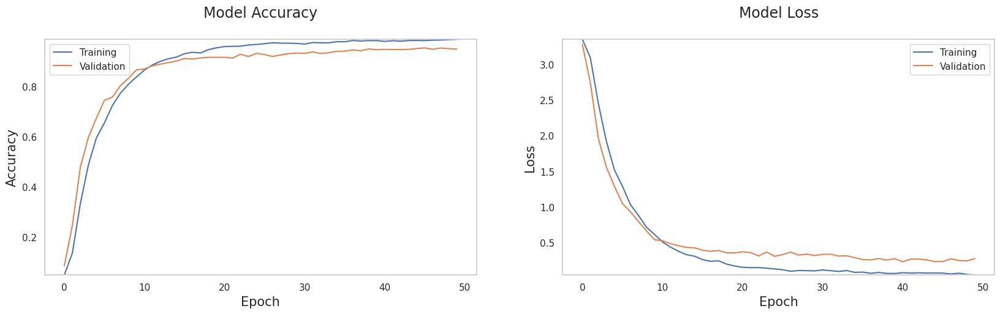

In [ ]:
ylim_pad=[0, 0]
xlabel = 'Epoch'
legends = ['Training', 'Validation']
plt.figure(figsize=(20, 5))
y1 = history.history['accuracy']
y2 = history.history['val_accuracy']
min_y = min(min(y1), min(y2))-ylim_pad[0]
max_y = max(max(y1), max(y2))+ylim_pad[0]
plt.subplot(121)
plt.plot(y1)
plt.plot(y2)
plt.title('Model Accuracy\n', fontsize=17)
plt.xlabel(xlabel, fontsize=15)
plt.ylabel('Accuracy', fontsize=15)
plt.ylim(min_y, max_y)
plt.legend(legends, loc='upper left')
plt.grid()
y1 = history.history['loss']
y2 = history.history['val_loss']
min_y = min(min(y1), min(y2))-ylim_pad[1]
max_y = max(max(y1), max(y2))+ylim_pad[1]
plt.subplot(122)
plt.plot(y1)
plt.plot(y2)
plt.title('Model Loss\n', fontsize=17)
plt.xlabel(xlabel, fontsize=15)
plt.ylabel('Loss', fontsize=15)
plt.ylim(min_y, max_y)
plt.legend(legends, loc='upper right')
plt.grid()
plt.show()

# **Create Test Data Generator**

In [ ]:
test_gen = ImageDataGenerator(rescale=1./255)
test_generator = test_gen.flow_from_directory(
    testpath+'/test',
    target_size=(s,s),
    class_mode='categorical',
    shuffle=False
)

Found 958 images belonging to 30 classes.


# **Display Test Images**

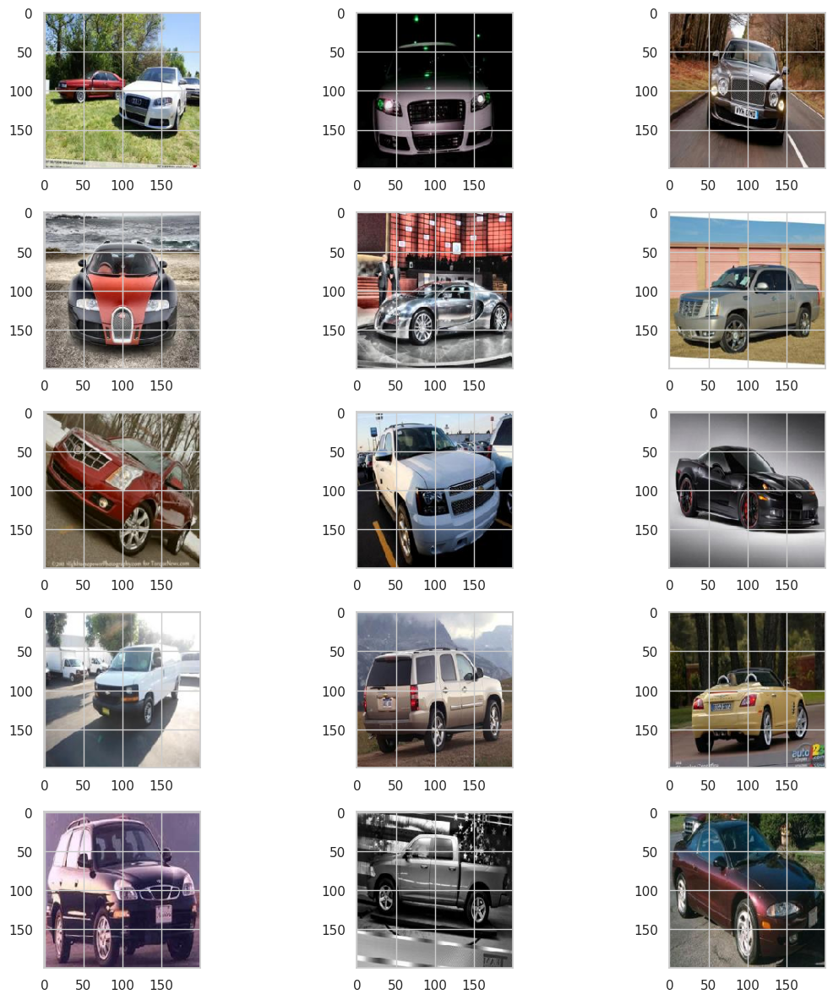

In [ ]:
plt.figure(figsize=(12, 12))
for i in range(0, 15):
    plt.subplot(5, 3, i+1)
    for X_batch, Y_batch in test_generator:
        image = X_batch[0]
        plt.imshow(image)
        break
plt.tight_layout()
plt.show()

# **Make Predictions with Model**

In [ ]:
predict = model.predict(test_generator, verbose=1)
predicted_classes = np.argmax(predict, axis=1)


30/30 ━━━━━━━━━━━━━━━━━━━━ 9s 309ms/step


# **Evaluate Model Prediction**

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
true_classes = test_generator.classes
class_labels = list(test_generator.class_indices.keys())
report = classification_report(true_classes, predicted_classes, target_names=class_labels)
print(report)

                                             precision    recall  f1-score   support

                         Audi S4 Sedan 2007       1.00      0.91      0.95        33
                        Audi TTS Coupe 2012       0.94      1.00      0.97        30
                Bentley Mulsanne Sedan 2011       0.94      0.97      0.95        32
             Bugatti Veyron 16.4 Coupe 2009       0.97      0.97      0.97        35
        Cadillac Escalade EXT Crew Cab 2007       0.94      1.00      0.97        33
                      Cadillac SRX SUV 2012       0.97      0.94      0.95        31
          Chevrolet Avalanche Crew Cab 2012       1.00      0.94      0.97        33
                Chevrolet Corvette ZR1 2012       1.00      0.97      0.98        33
                 Chevrolet Express Van 2007       0.97      0.97      0.97        30
Chevrolet Silverado 2500HD Regular Cab 2012       1.00      0.89      0.94        28
            Chevrolet Tahoe Hybrid SUV 2012       0.90      0.96

# **Confusion Matrix Visualization**

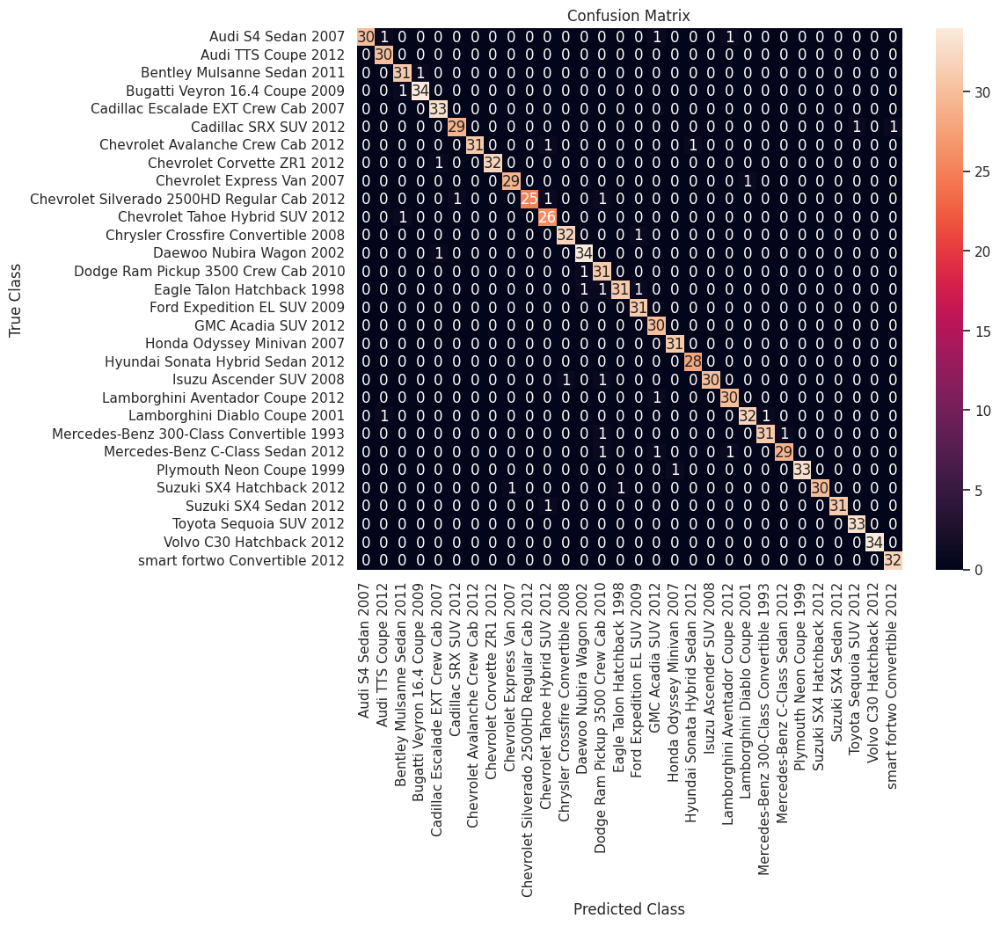

In [ ]:
conf_matrix = confusion_matrix(true_classes, predicted_classes)

plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel('Predicted Class')
plt.ylabel('True Class')
plt.title('Confusion Matrix')
plt.show()


# **Display Errors**

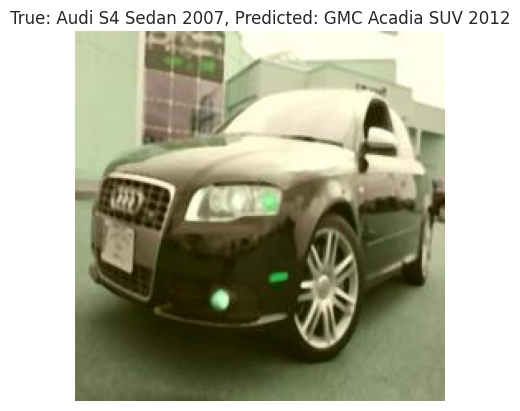

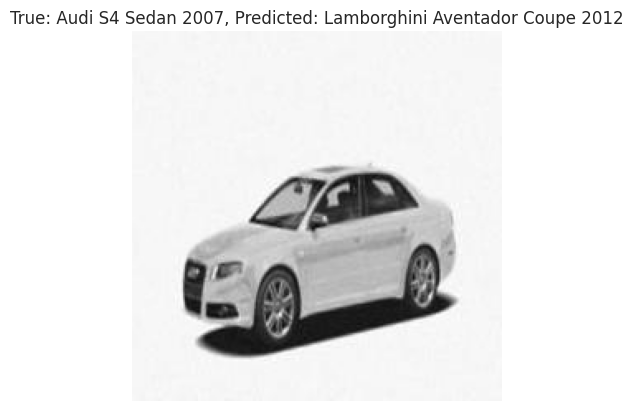

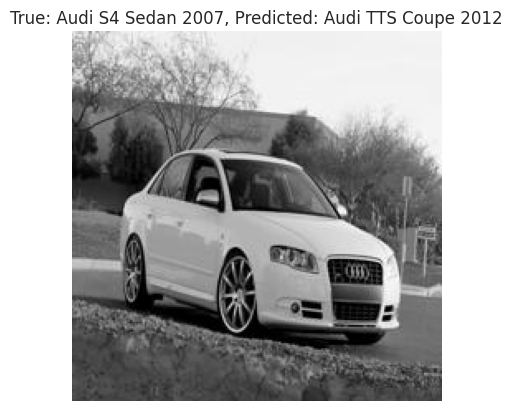

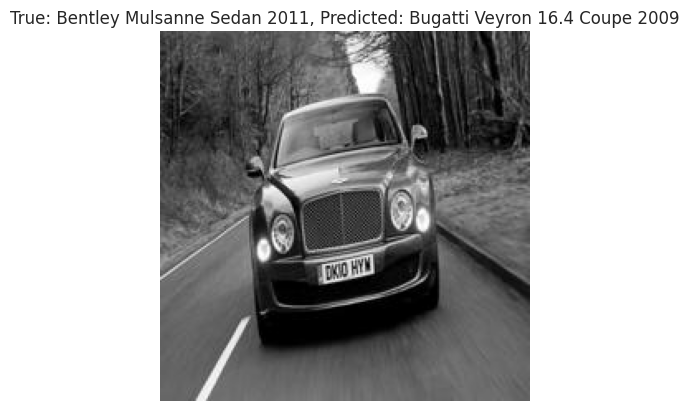

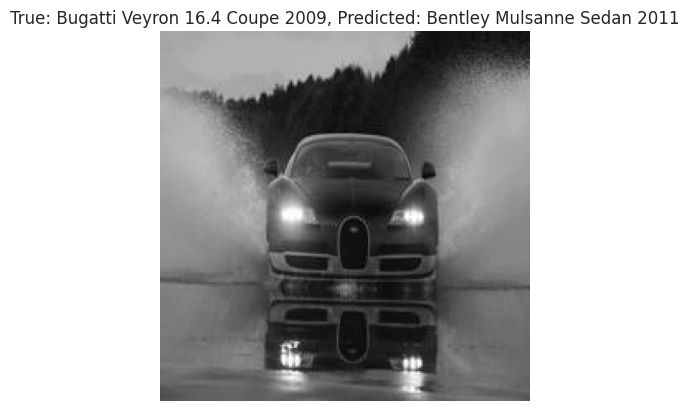

...

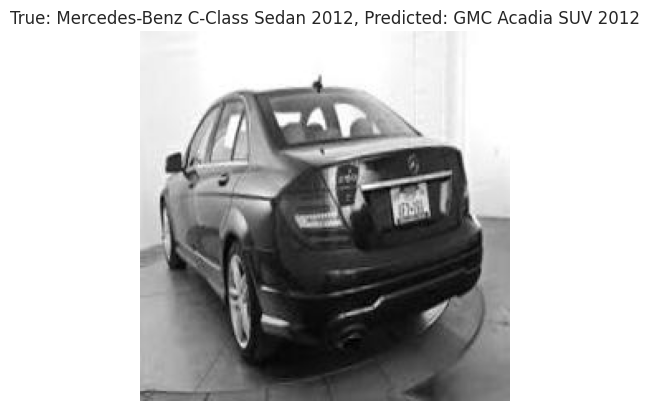

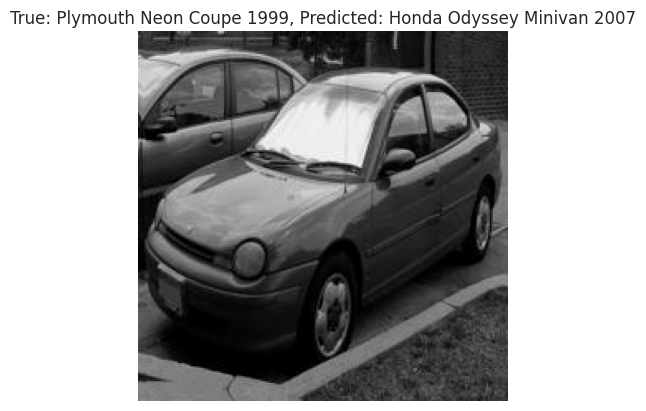

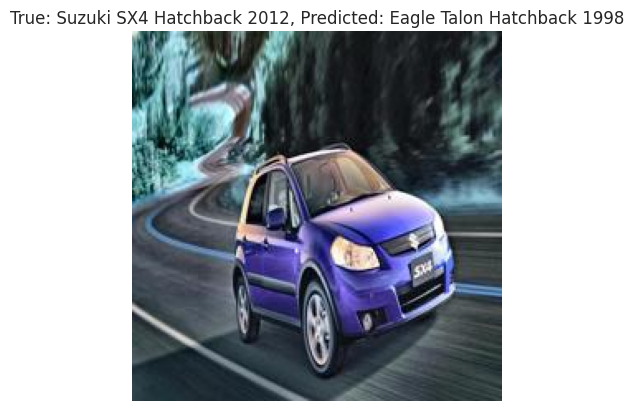

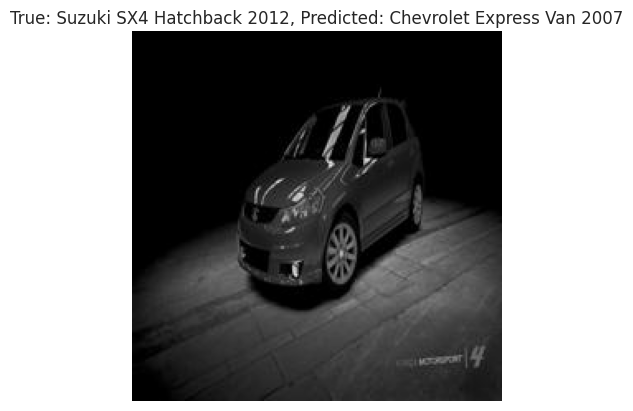

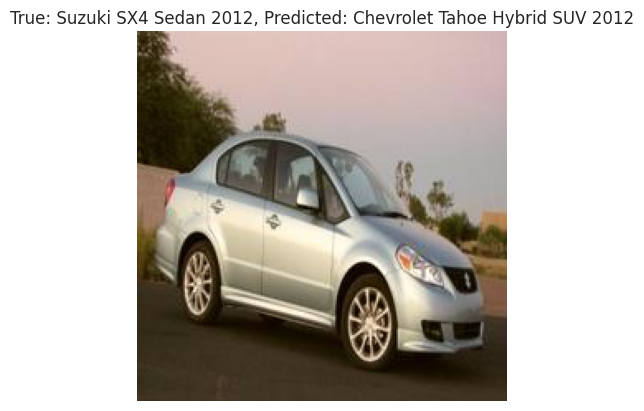

In [ ]:
for i in range(len(predicted_classes)):
    if predicted_classes[i] != true_classes[i]:
        img_path = test_generator.filepaths[i]
        image = plt.imread(img_path)
        plt.imshow(image)
        plt.title(f'True: {class_labels[true_classes[i]]}, Predicted: {class_labels[predicted_classes[i]]}')
        plt.axis('off')
        plt.show()
